# Подготовка

In [1]:
from google.colab import drive
GOOGLE_DRIVE_MOUNT = "/content/gdrive"
drive.mount(GOOGLE_DRIVE_MOUNT)

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [2]:
% cd ..
! cp -rf '/content/gdrive/My Drive/colab/Frame_Classification' .
% cd Frame_Classification

/
/Frame_Classification


In [3]:
! pip install wavio
! pip install soundfile
! pip install nlpaug
! pip install keras-metrics

In [0]:
import os
import numpy as np
from core import read_meta_yaml
import wave
import contextlib
import wavio
from scipy import signal
import matplotlib.pyplot as plt
from itertools import groupby
import librosa
import nlpaug.flow as naf
import nlpaug.augmenter.spectrogram as nas
import nlpaug.augmenter.audio as naa

In [0]:
WINDOW_WIDTH = 5e-1 #s
HOP_LENGTH = 225
SAMPLE_RATE = 44100
SPECTROGRAM_HEIGH = 129
SPECTROGRAM_WIDTH = int(WINDOW_WIDTH * SAMPLE_RATE / HOP_LENGTH)
PROB_TRESHOLD = 0.8

In [0]:
class_labels = ['clearthroat', 'knock', 'keys', 'bg']
NUM_CLASSES = len(class_labels)
class_to_idx = {c: idx for idx, c in enumerate(class_labels)}
idx_to_class = {class_to_idx[c]: c for c in class_to_idx.keys()}

In [0]:
def create_spectrogram_from_wav_file(wavfile_path, onset, offset):
    audio = wavio.read(wavfile_path).data
    if audio.shape[1] > 1:
        audio = np.sum(audio, axis = 1)
    else:
        audio = audio.reshape((-1,))
    if offset*SAMPLE_RATE > audio.shape[0]:
      
        old = audio.shape
        new = (int(SAMPLE_RATE * WINDOW_WIDTH), )
        samples = audio[(np.arange(new[0]) % old[0])]
    else:
        samples = audio[int(onset*SAMPLE_RATE):int(offset*SAMPLE_RATE)]
    frequencies, times, spectrogram = signal.spectrogram(samples, SAMPLE_RATE)
#    fig=plt.figure(figsize=((5, 5)))
#    ax=fig.add_subplot(1,1,1)
#    plt.axis('off')
#    plt.pcolormesh(times, frequencies, np.log10(spectrogram+1e-20), figure = fig)
    return spectrogram

In [8]:
import tensorflow as tf
import keras
from keras import backend as K

Using TensorFlow backend.


In [0]:
# reset graph when you change architecture!
def reset_tf_session():
    curr_session = tf.get_default_session()
    # close current session
    if curr_session is not None:
        curr_session.close()
    # reset graph
    K.clear_session()
    # create new session
    config = tf.ConfigProto()
    config.gpu_options.allow_growth = True
    s = tf.InteractiveSession(config=config)
    K.set_session(s)
    return s

In [0]:
# import necessary building blocks
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Activation, Dropout, GlobalAveragePooling2D, \
    BatchNormalization

In [0]:
from keras.metrics import categorical_crossentropy, categorical_accuracy
from keras_metrics import precision, recall, f1_score

In [0]:
def make_model2():
   
    model = Sequential()
    
    model.add(Conv2D(filters=32, kernel_size=(3, 3), strides=2, padding='same', input_shape=(SPECTROGRAM_HEIGH, SPECTROGRAM_WIDTH, 1)))
    model.add(BatchNormalization())
    model.add(Activation('relu'))
    
    model.add(Conv2D(filters=32, kernel_size=(3, 3), strides=1, padding='same'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))
    
    ############################################################################
    
    model.add(Conv2D(filters=64, kernel_size=(3, 3), strides=2, padding='same'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))
    
    model.add(Conv2D(filters=64, kernel_size=(1, 1), strides=1, padding='same'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))
    
    model.add(Conv2D(filters=64, kernel_size=(1, 1), strides=1, padding='same'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))
    
    ############################################################################
    
    model.add(Conv2D(filters=128, kernel_size=(3, 3), strides=2, padding='same'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))
    
    model.add(Conv2D(filters=128, kernel_size=(1, 1), strides=1, padding='same'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))
    
    ############################################################################
    
    model.add(Conv2D(filters=256, kernel_size=(3, 3), strides=1, padding='same'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))
    
    model.add(Conv2D(filters=256, kernel_size=(1, 1), strides=1, padding='same'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))
    
    model.add(Conv2D(filters=256, kernel_size=(3, 3), strides=1, padding='same'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))
    
    model.add(Conv2D(filters=256, kernel_size=(1, 1), strides=1, padding='same'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))
    
    model.add(Conv2D(filters=256, kernel_size=(3, 3), strides=1, padding='same'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))
    
    model.add(Conv2D(filters=256, kernel_size=(1, 1), strides=1, padding='same'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))
    
    model.add(Conv2D(filters=256, kernel_size=(3, 3), strides=1, padding='same'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))
    
    model.add(Conv2D(filters=256, kernel_size=(1, 1), strides=1, padding='same'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))
    
    ############################################################################
    
    
    model.add(Conv2D(filters=256, kernel_size=(3, 3), strides=2, padding='same'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))
    
    model.add(Conv2D(filters=256, kernel_size=(1, 1), strides=1, padding='same'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))
    
    ############################################################################
    
    model.add(Conv2D(filters=512, kernel_size=(3, 3), strides=1, padding='same'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))
    
    model.add(Conv2D(filters=512, kernel_size=(1, 1), strides=1, padding='same'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))
    
    model.add(Conv2D(filters=512, kernel_size=(3, 3), strides=1, padding='same'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))
    
    model.add(Conv2D(filters=512, kernel_size=(1, 1), strides=1, padding='same'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))
    
    model.add(Conv2D(filters=512, kernel_size=(3, 3), strides=1, padding='same'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))
    
    model.add(Conv2D(filters=512, kernel_size=(1, 1), strides=1, padding='same'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))
    
    ############################################################################
    
    model.add(Conv2D(filters=512, kernel_size=(3, 3), strides=2, padding='same'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))
    
    model.add(Conv2D(filters=512, kernel_size=(1, 1), strides=1, padding='same'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))
    
    ############################################################################
    
    model.add(Conv2D(filters=1024, kernel_size=(3, 3), strides=2, padding='same'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))
    
    model.add(Conv2D(filters=1024, kernel_size=(1, 1), strides=1, padding='same'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))
    
    ############################################################################  
    
    model.add(GlobalAveragePooling2D())
    
    ############################################################################

    model.add(Dense(1024))
    model.add(BatchNormalization())
    model.add(Activation('relu'))
    
    model.add(Dense(NUM_CLASSES, activation="softmax"))
    
    return model

In [13]:
BATCH_SIZE = 256

s = reset_tf_session()  # clear default graph
model = make_model2()  # define our model

# prepare model for fitting (loss, optimizer, etc)
model.compile(
    loss='categorical_crossentropy',
    optimizer=keras.optimizers.Adadelta(lr=1.0, rho=0.95, epsilon=1e-08, decay=0.0),
    metrics=[categorical_accuracy, precision(), recall(), f1_score()]
)

W0815 12:33:30.639681 140132232370048 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:95: The name tf.reset_default_graph is deprecated. Please use tf.compat.v1.reset_default_graph instead.

W0815 12:33:30.642545 140132232370048 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:98: The name tf.placeholder_with_default is deprecated. Please use tf.compat.v1.placeholder_with_default instead.

W0815 12:33:30.661836 140132232370048 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:102: The name tf.get_default_graph is deprecated. Please use tf.compat.v1.get_default_graph instead.

W0815 12:33:30.894598 140132232370048 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:517: The name tf.placeholder is deprecated. Please use tf.compat.v1.placeholder instead.

W081

In [0]:
def test_iterator(batch_size, audio_path):
    audio_paths = []
    if os.path.isdir(audio_path):
        for inp_file in os.listdir(audio_path):
            audio_paths += [audio_path + inp_file]
    else:
        audio_paths += [audio_path] 
        
    audio_paths = [inp_file for inp_file in audio_paths if (inp_file[-4:]  == '.wav')]
    
    tracks = []

    batch_keys = []
    batch_data = []
    
    for j, inp_audio in enumerate(audio_paths):
        data = wavio.read(inp_audio).data
        
        full_segments = (data.shape[0] /  float(SAMPLE_RATE)) // WINDOW_WIDTH
        if (data.shape[0] / float(SAMPLE_RATE)) % WINDOW_WIDTH != 0:
            full_segments += 1
        
        segments = []
        for i in range(int(full_segments)):
            

            batch_data.append(create_spectrogram_from_wav_file(inp_audio, i * WINDOW_WIDTH, (i+1)*WINDOW_WIDTH))
            batch_keys.append((inp_audio,i))
            if len(batch_data) == batch_size:
                
                batch_data = np.stack(batch_data, axis=0)
                batch_data = np.expand_dims(batch_data, -1)
                batch_data = batch_data.astype('float32')
                batch_data = batch_data +  1e-21
                batch_data = np.log10(batch_data)
                batch_data =  (((batch_data - np.min(batch_data)) * (1 - (-1))) / float(np.max(batch_data) - np.min(batch_data))) + (-1)
              
                yield batch_keys, batch_data
                batch_keys = []
                batch_data = []    
   
    if batch_data:  # last batch
        batch_data = np.stack(batch_data, axis=0)
        batch_data = np.expand_dims(batch_data, -1)
        batch_data = batch_data.astype('float32')
       
        batch_data = batch_data +  1e-21
        batch_data = np.log10(batch_data)
        batch_data =  (((batch_data - np.min(batch_data)) * (1 - (-1))) / float(np.max(batch_data) - np.min(batch_data))) + (-1)

        yield batch_keys, batch_data
        batch_keys = []
        batch_data = [] 

In [0]:
def predict(audio_path = './test_audio_folder/'):
    colors = ['r', 'g', 'b', 'y']
    
    keys = []
    classes = []
    
    for batch_keys, batch_data in test_iterator(BATCH_SIZE, audio_path):
        keys.append(batch_keys)
        probs = model.predict_proba(batch_data, BATCH_SIZE)
        prob_argmax = np.argmax(probs, axis=1)
        prob_max = np.max(probs, axis=1)
        cs = [c if prob_max[i] > PROB_TRESHOLD else class_to_idx['bg'] for i,c in enumerate(prob_argmax)]
        classes.append(cs)

    classes = [c for batch in classes for c in batch]
    keys = [k for batch in keys for k in batch]
    
    keys_classes = list(zip(keys, classes))
    
    keys_classes.sort(key = lambda x : (x[0][0], x[0][1]))
    files = [list(g) for k, g in groupby(keys_classes, lambda s: s[0][0].partition('/')[-1])]
    for f in files:
        filename = f[0][0][0]
        window_classes = [i[1] for i in f]
        
        audio = wavio.read(filename).data
        if audio.shape[1] > 1:
            audio = np.sum(audio, axis = 1)
        else:
            audio = audio.reshape((-1,))

        plt.figure(figsize=(20,10))
        plt.title(filename)
        plt.plot(np.linspace(0, audio.shape[0], audio.shape[0]), audio)
        
        for i, window in enumerate(window_classes):
            lb = int(i * WINDOW_WIDTH * SAMPLE_RATE)
            rb = int(min(audio.shape[0], (i+1) * WINDOW_WIDTH * SAMPLE_RATE))
        
            plt.plot(np.linspace(0, audio.shape[0], audio.shape[0])[lb:rb], audio[lb:rb], label = idx_to_class[window], c = colors[window])
        
        handles, labels = plt.gca().get_legend_handles_labels()
        newLabels, newHandles = [], []
        for handle, label in zip(handles, labels):
            if label not in newLabels:
                newLabels.append(label)
                newHandles.append(handle)
        plt.legend(newHandles, newLabels)
        plt.xlabel('time (s)')

In [0]:
model.load_weights('model')

# Тестирование

## Обучающая выборка

### Clearthroat

/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


CPU times: user 2.75 s, sys: 1.56 s, total: 4.32 s
Wall time: 4.32 s


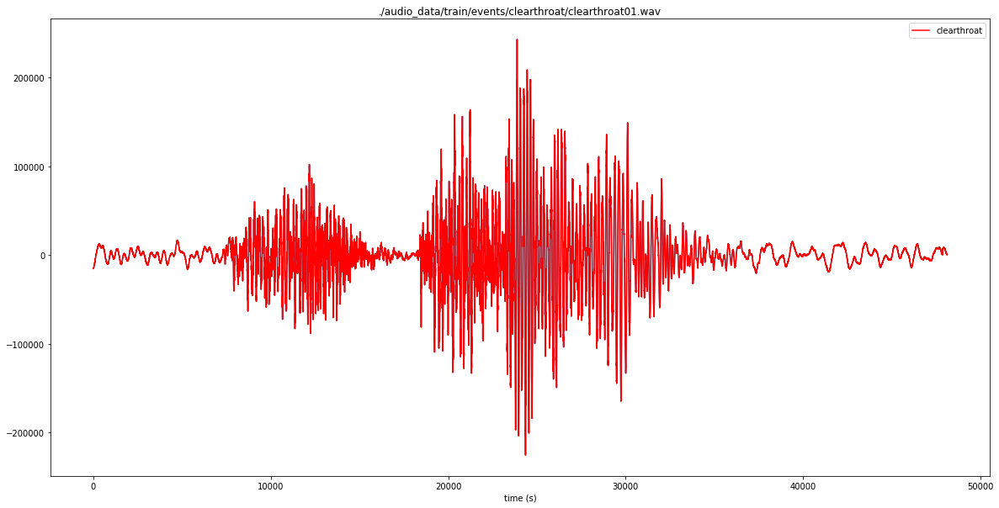

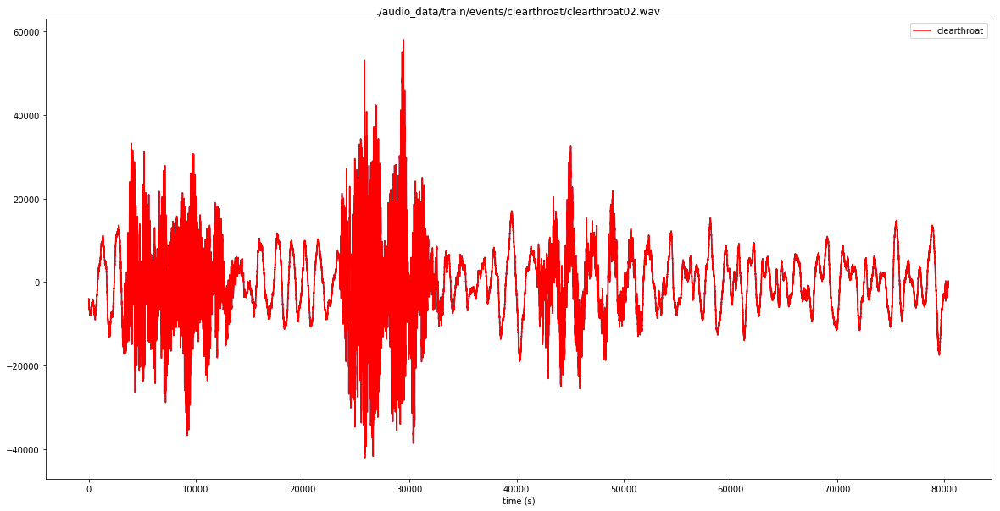

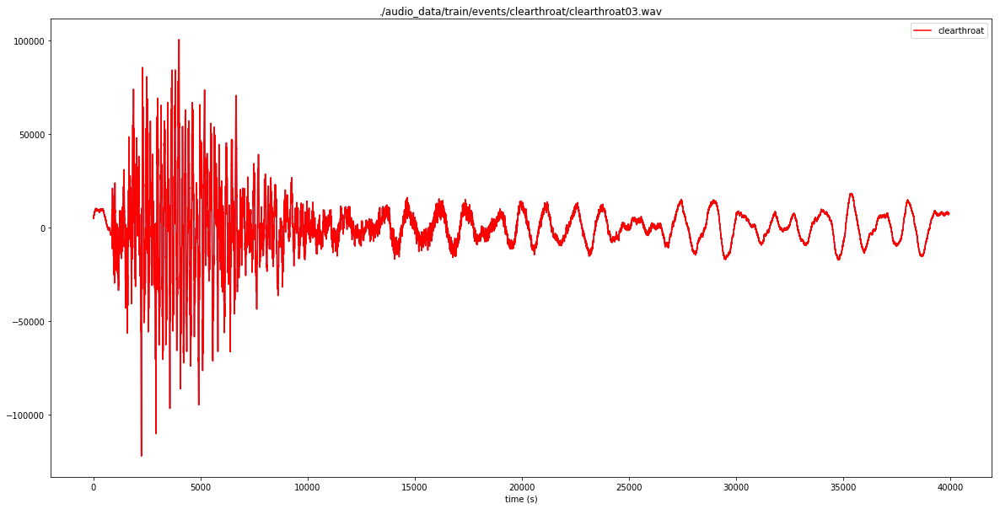

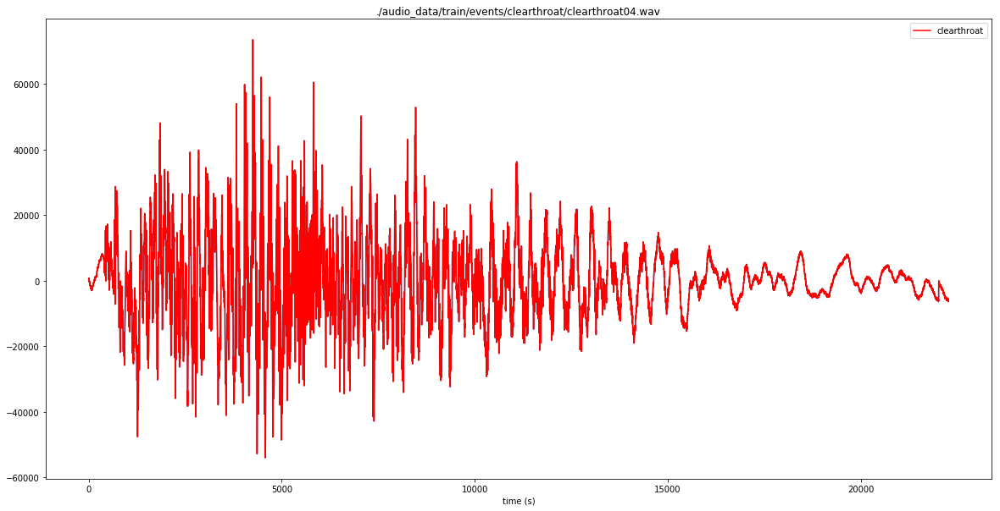

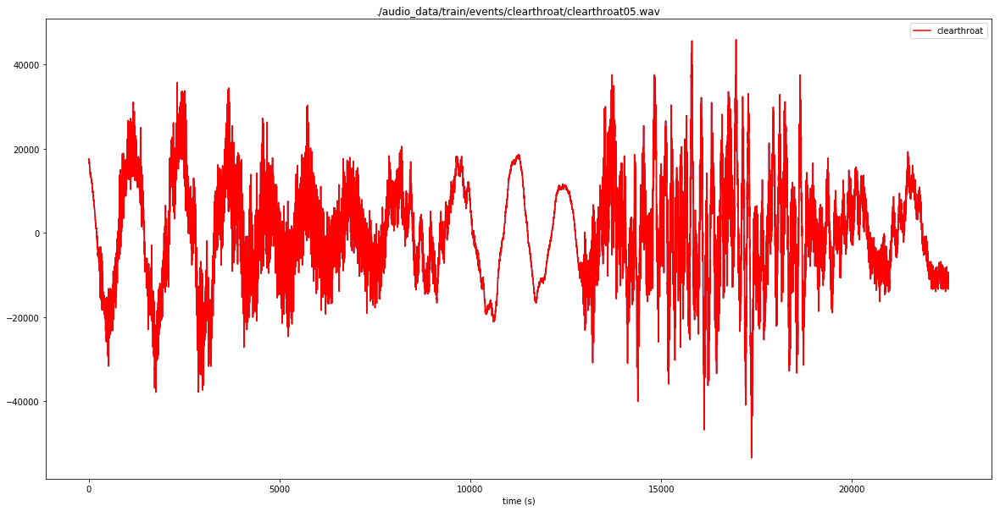

...

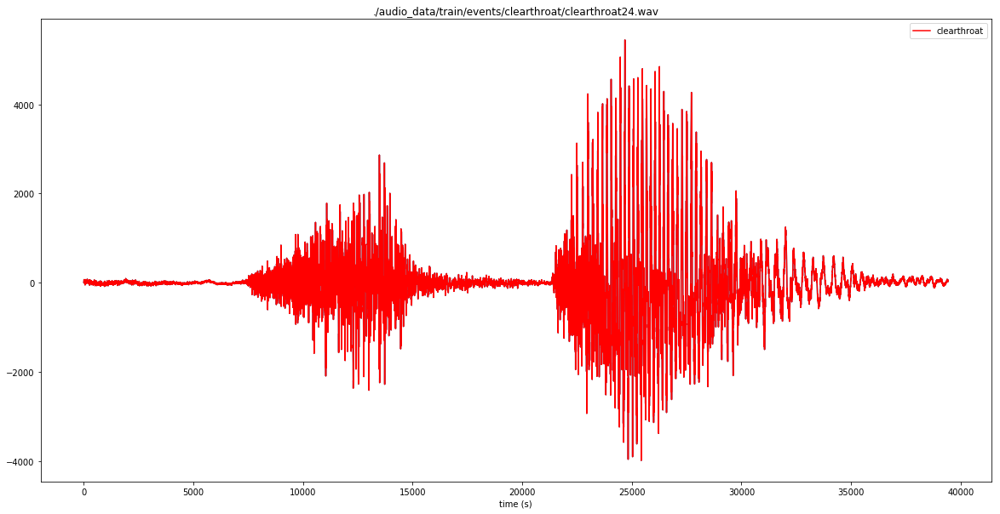

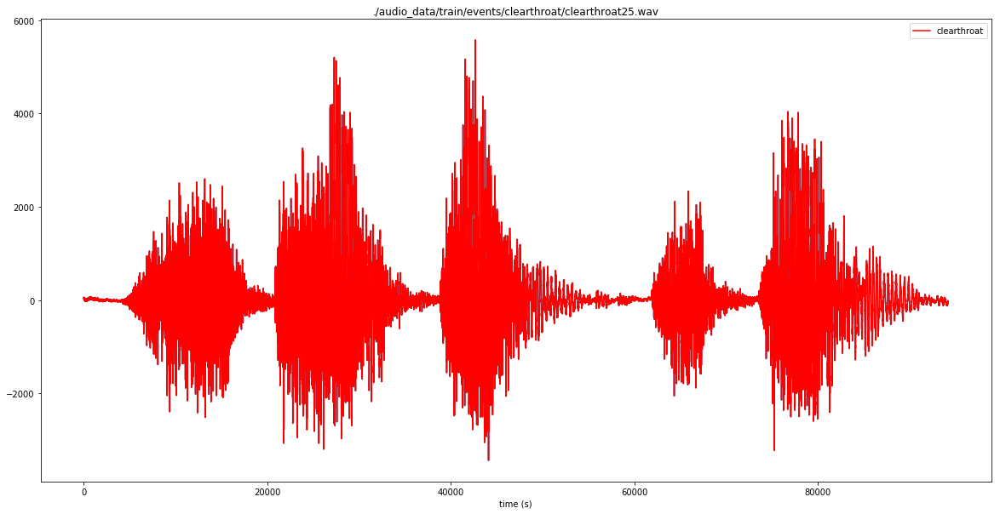

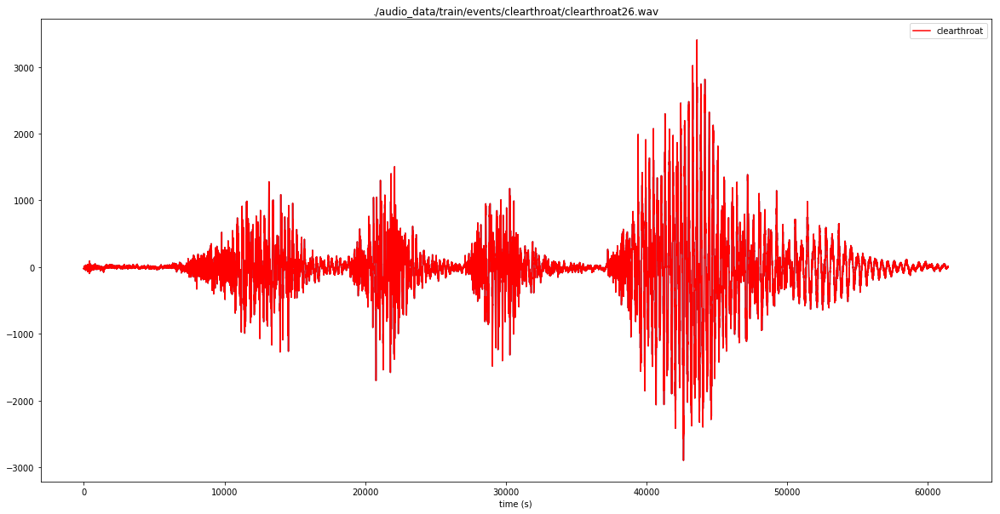

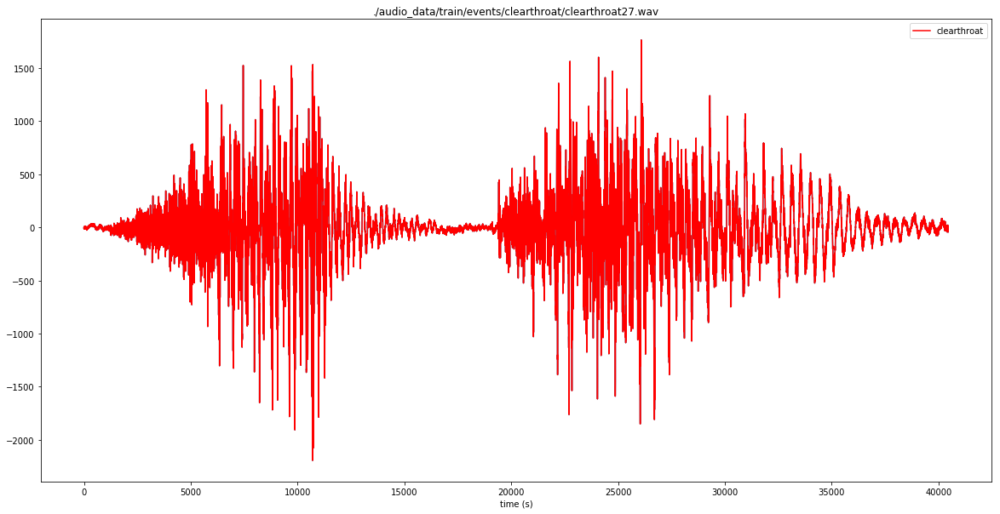

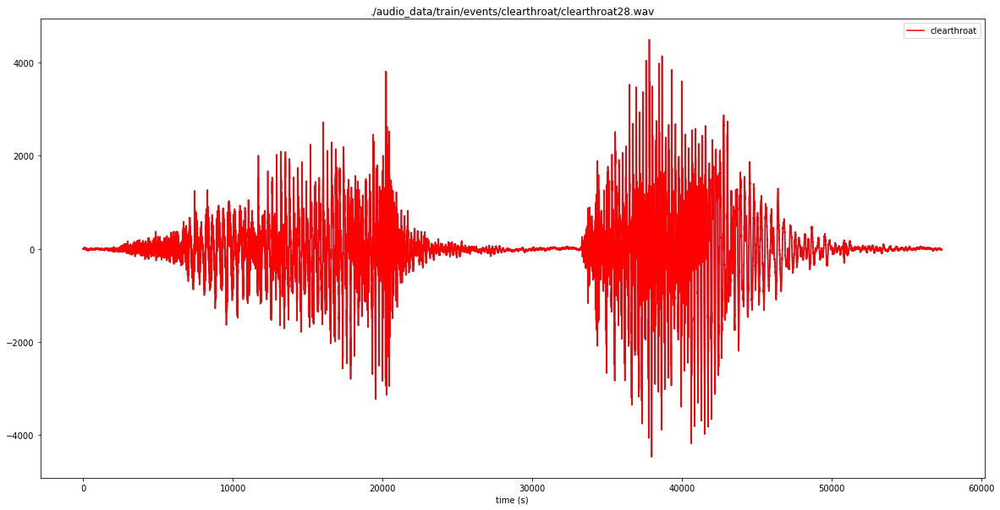

In [17]:
%%time
predict('./audio_data/train/events/clearthroat/')

### Keys

/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


CPU times: user 2.24 s, sys: 859 ms, total: 3.1 s
Wall time: 3.12 s


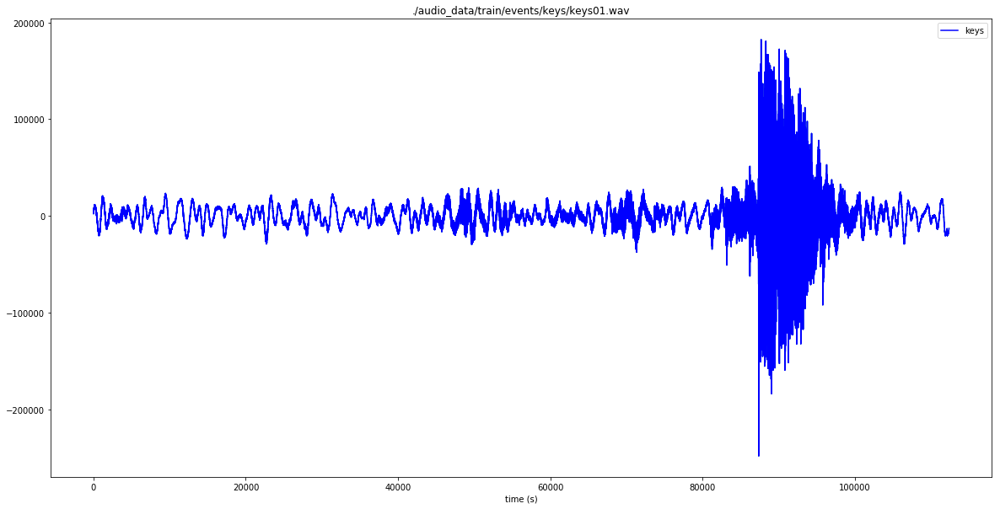

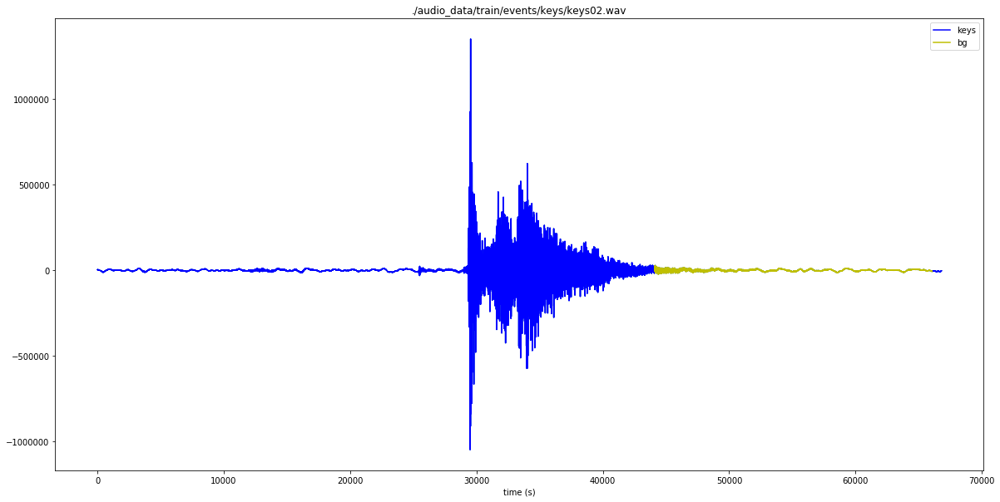

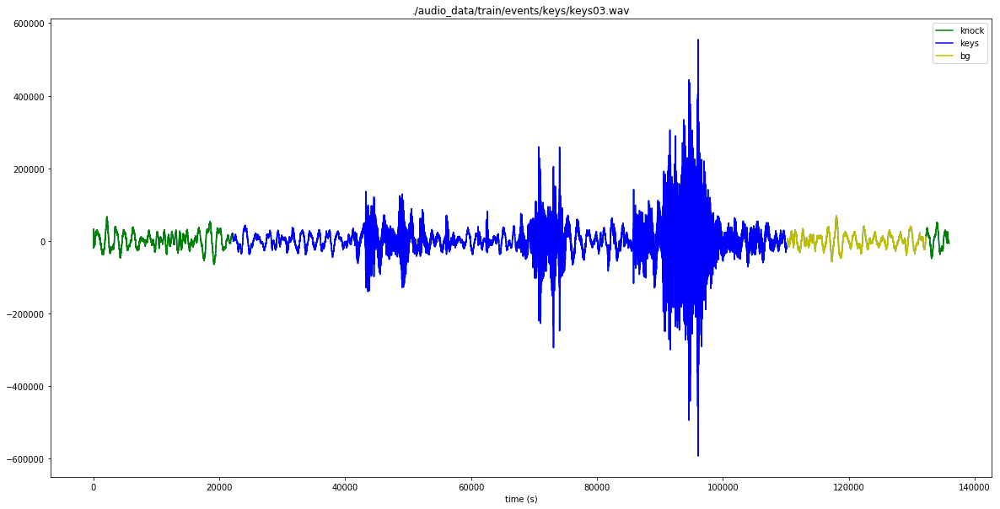

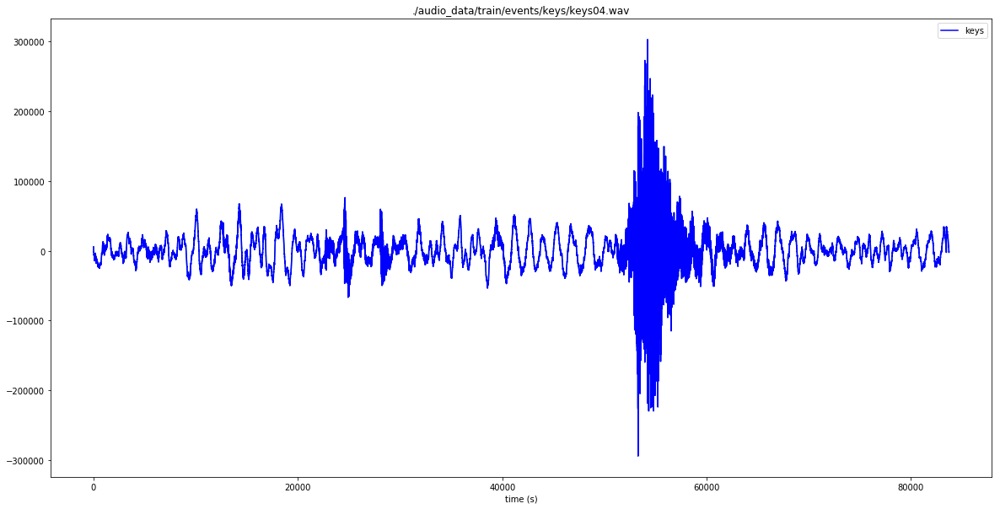

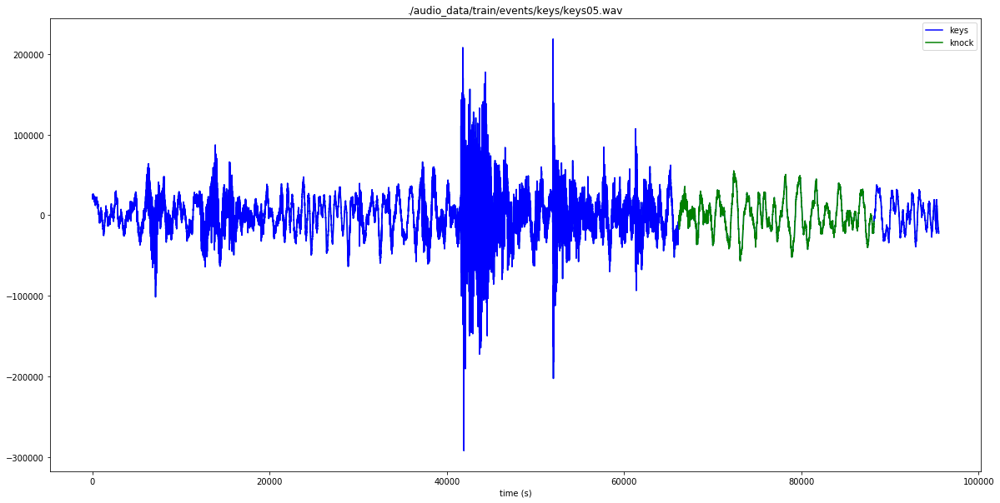

...

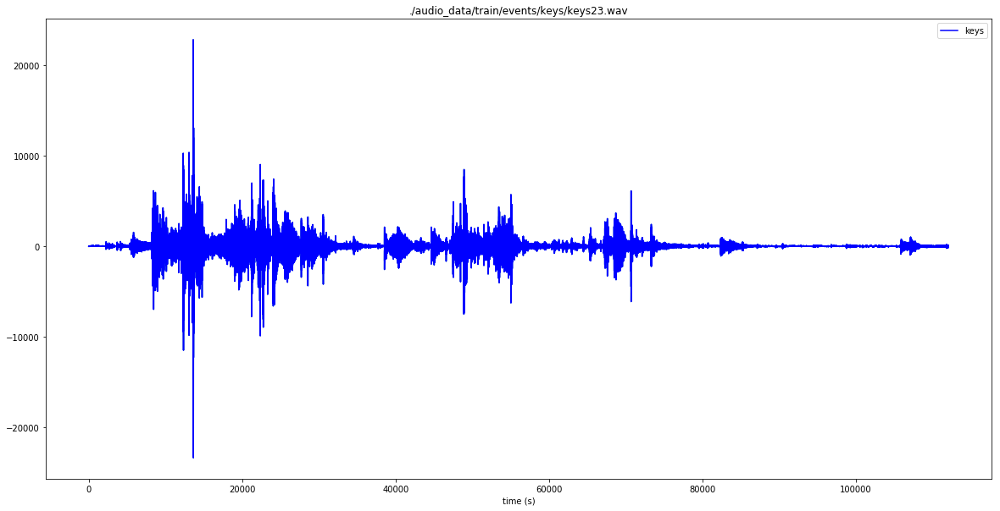

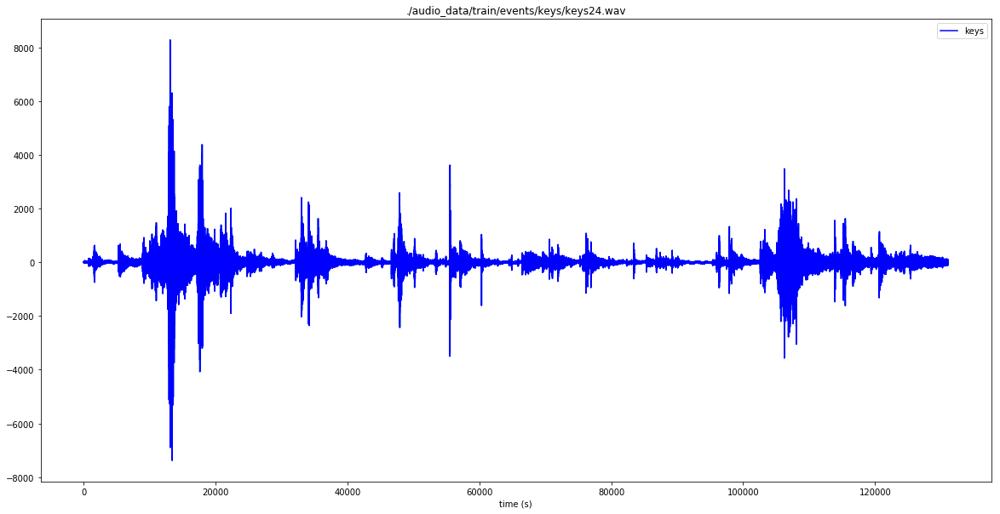

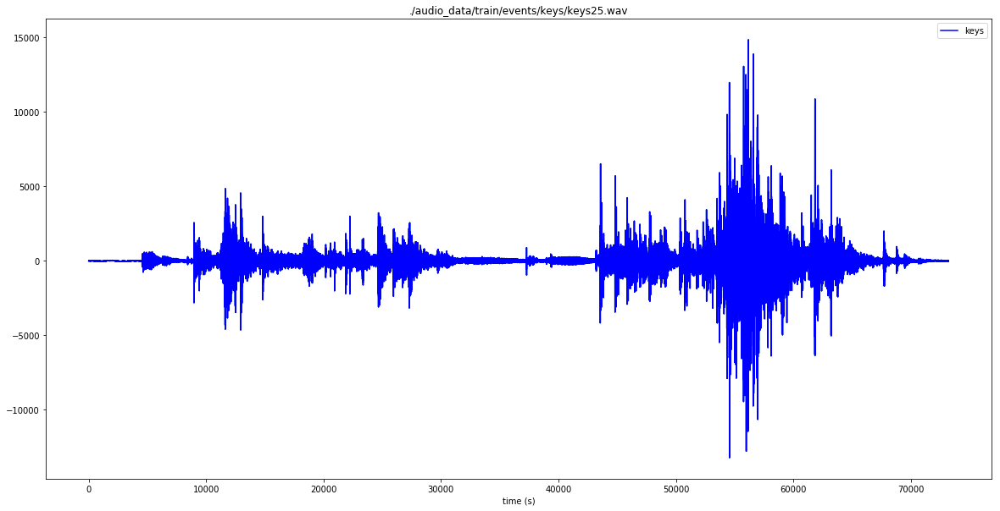

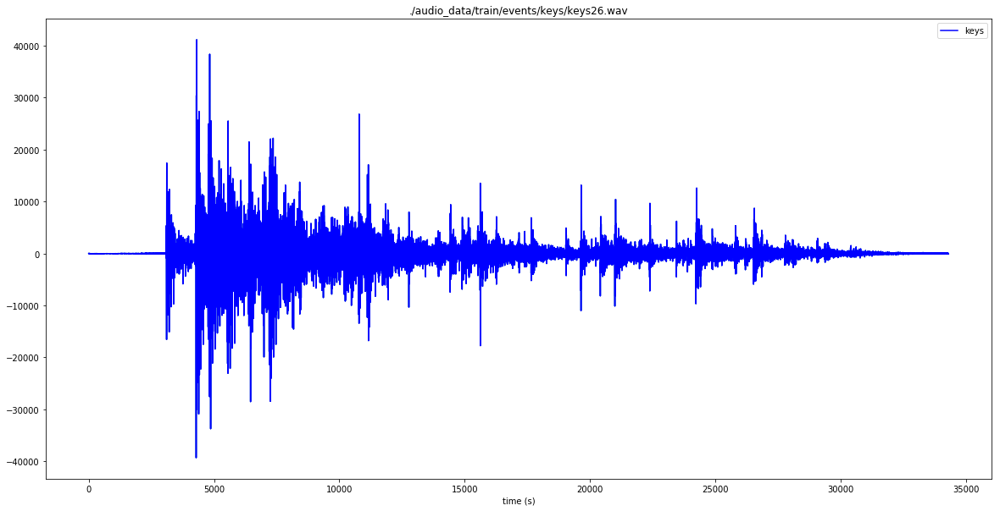

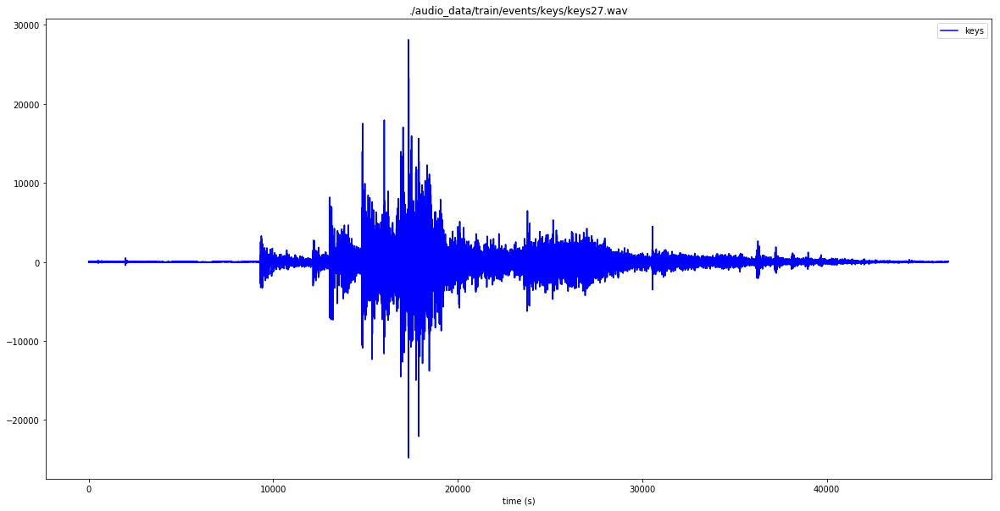

In [18]:
%%time
predict('./audio_data/train/events/keys/')

### Knock

/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


CPU times: user 1.27 s, sys: 527 ms, total: 1.8 s
Wall time: 1.81 s


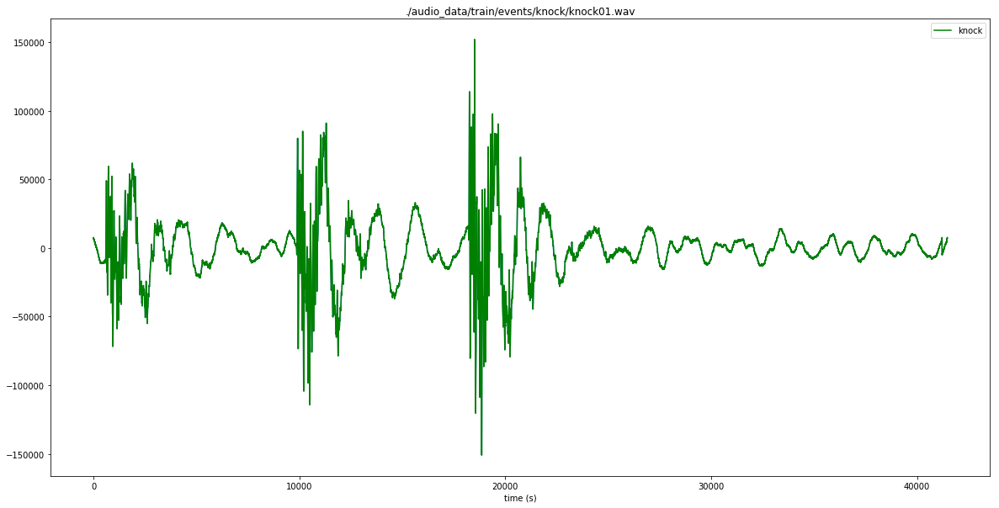

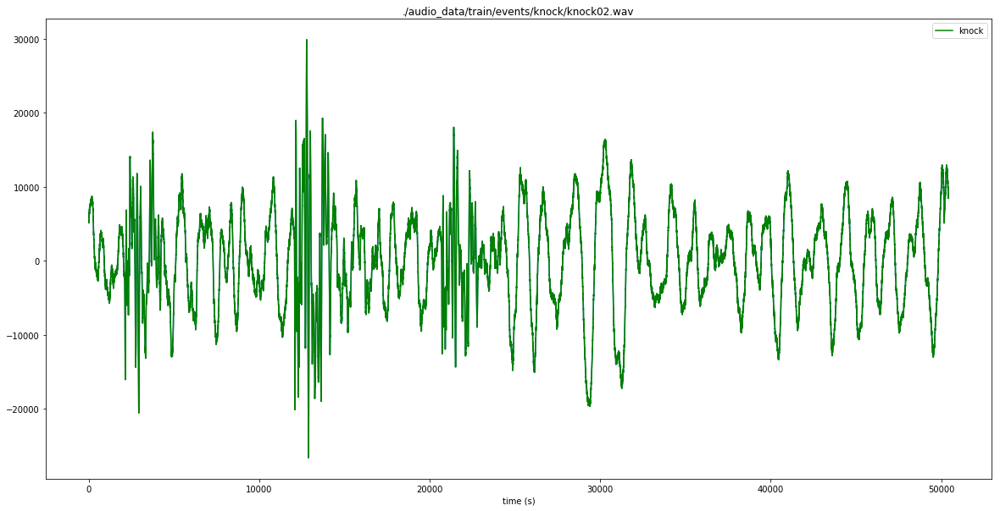

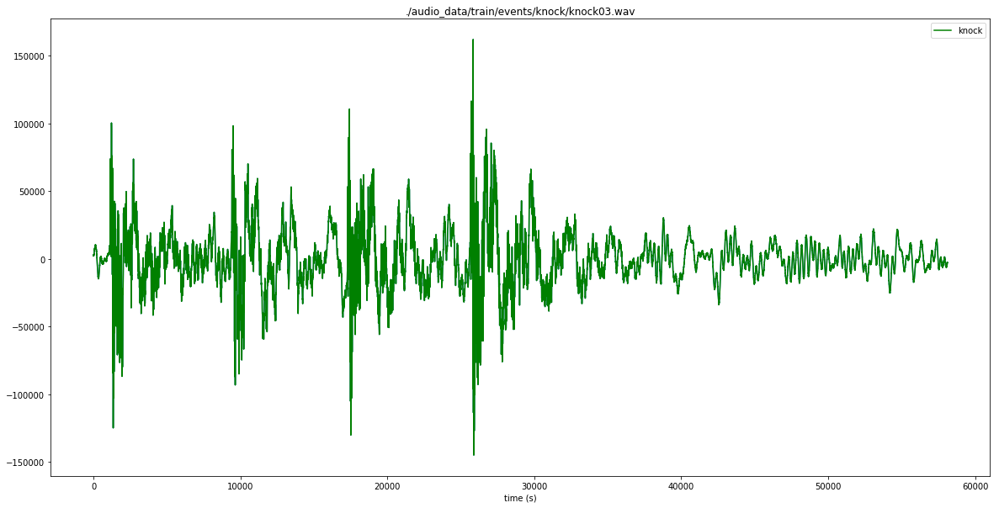

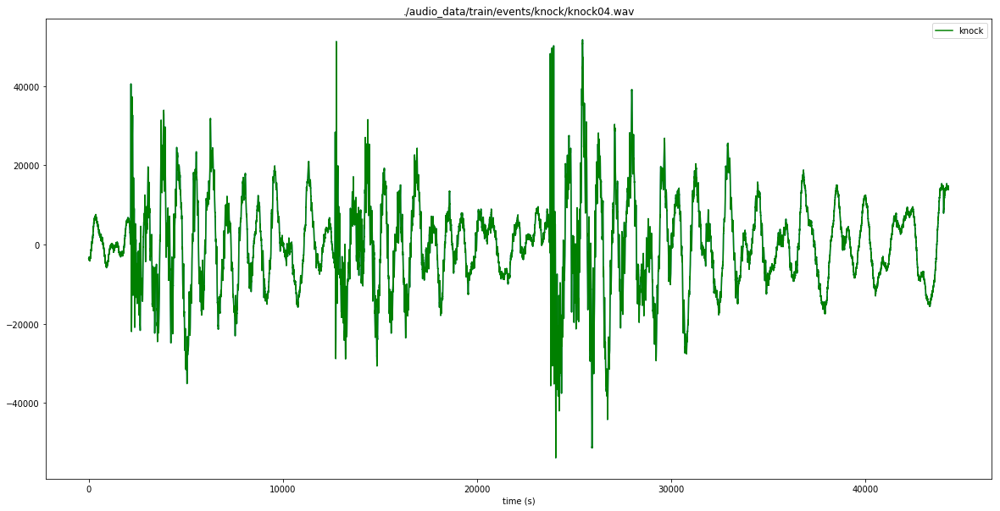

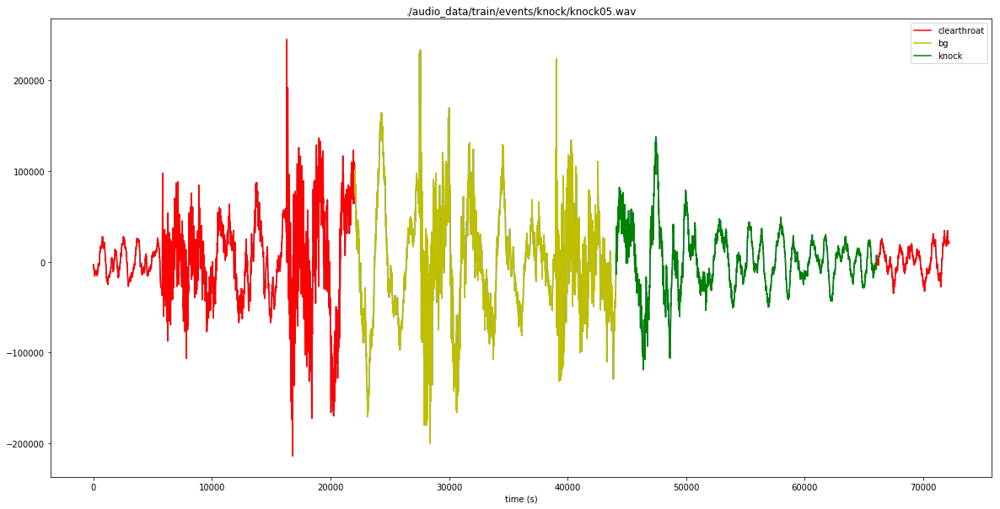

...

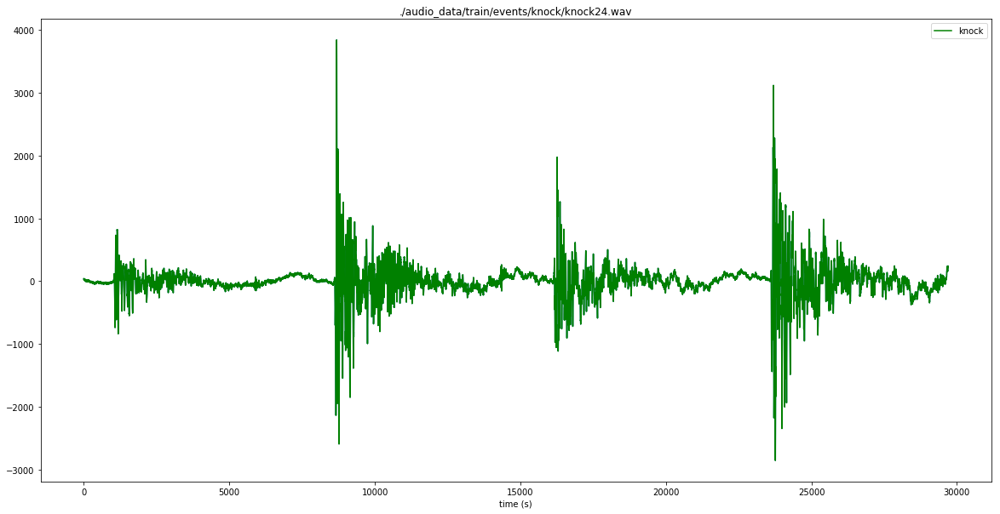

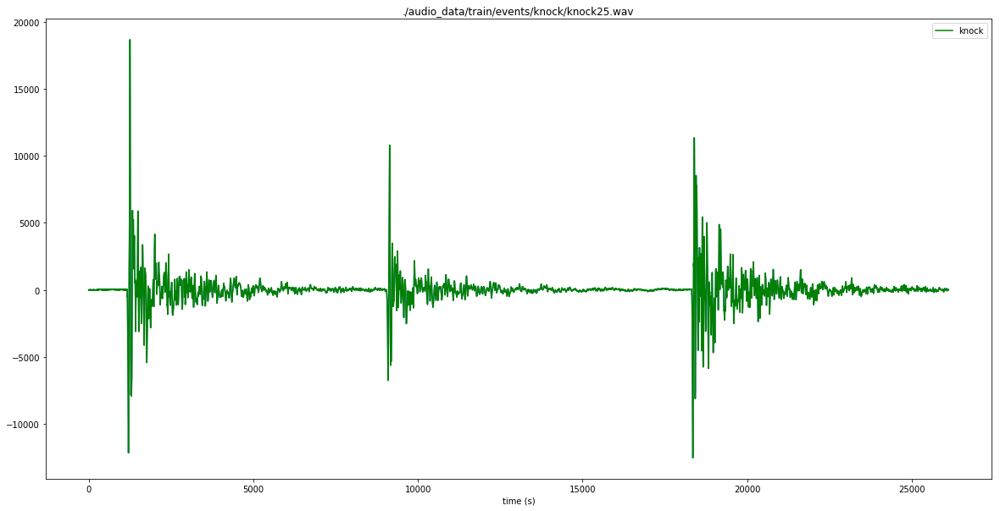

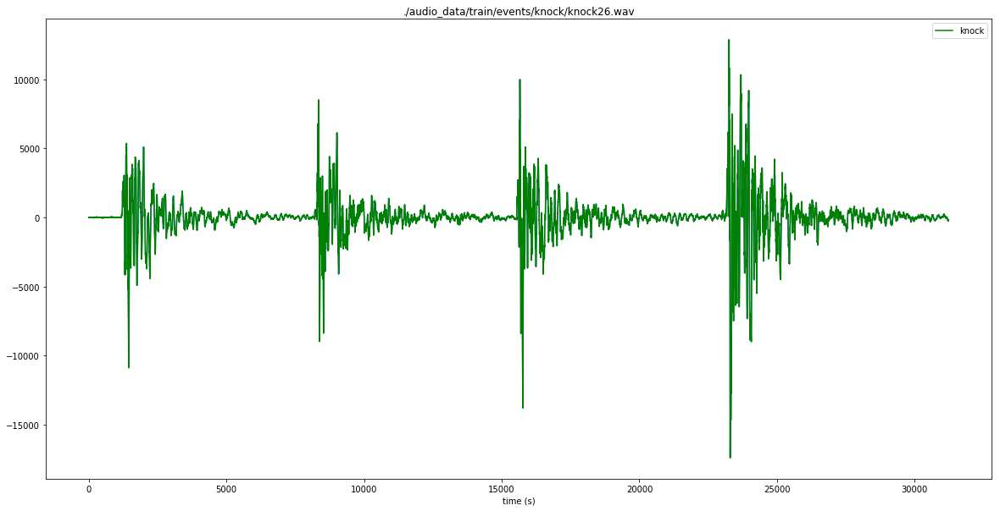

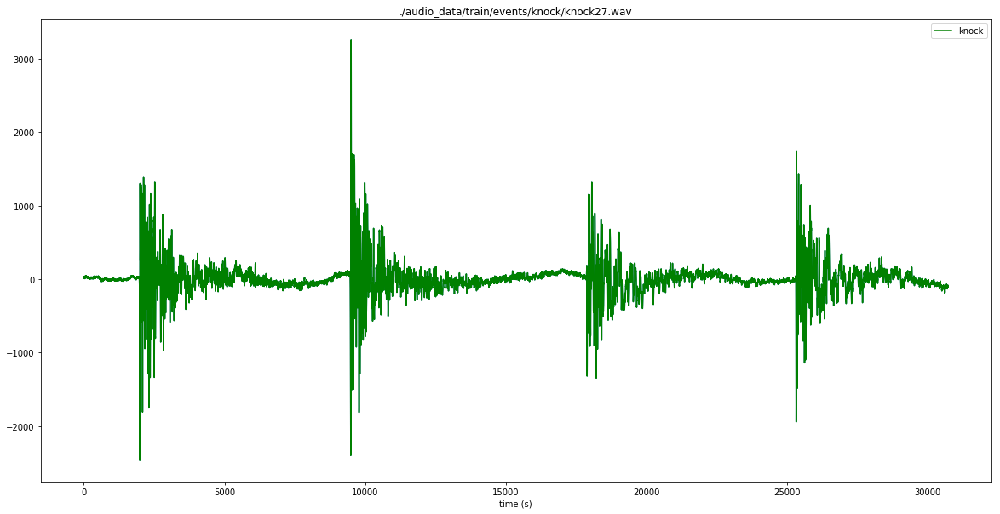

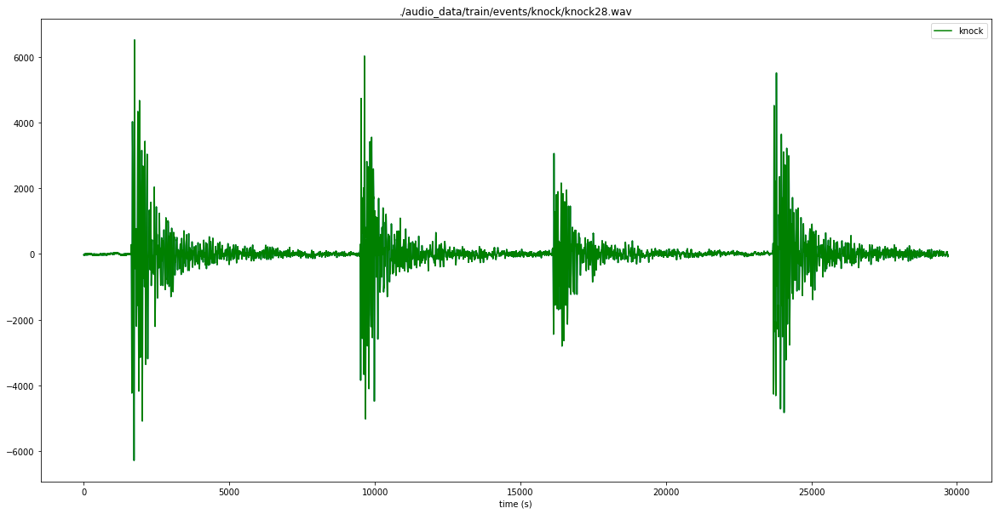

In [19]:
%%time
predict('./audio_data/train/events/knock/')

### Background

/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


CPU times: user 3.53 s, sys: 1.7 s, total: 5.23 s
Wall time: 5.23 s


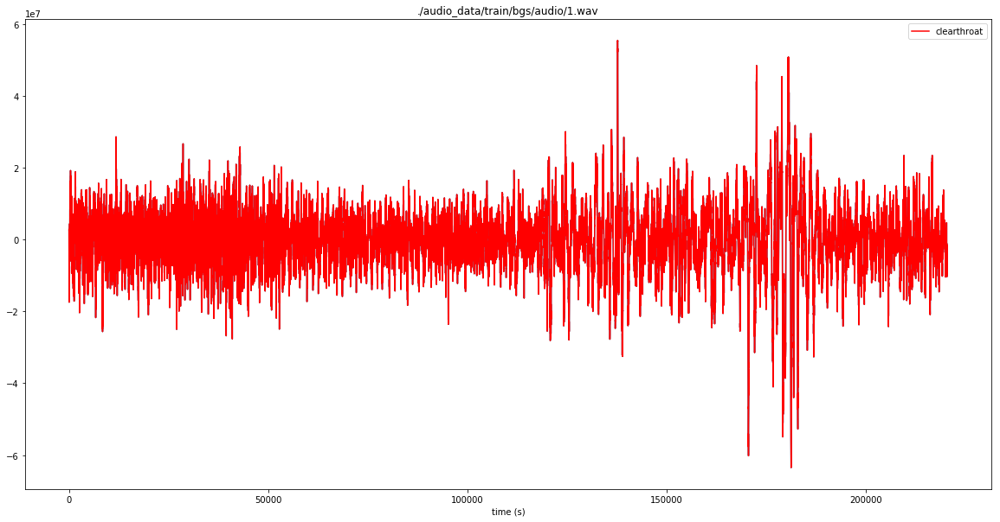

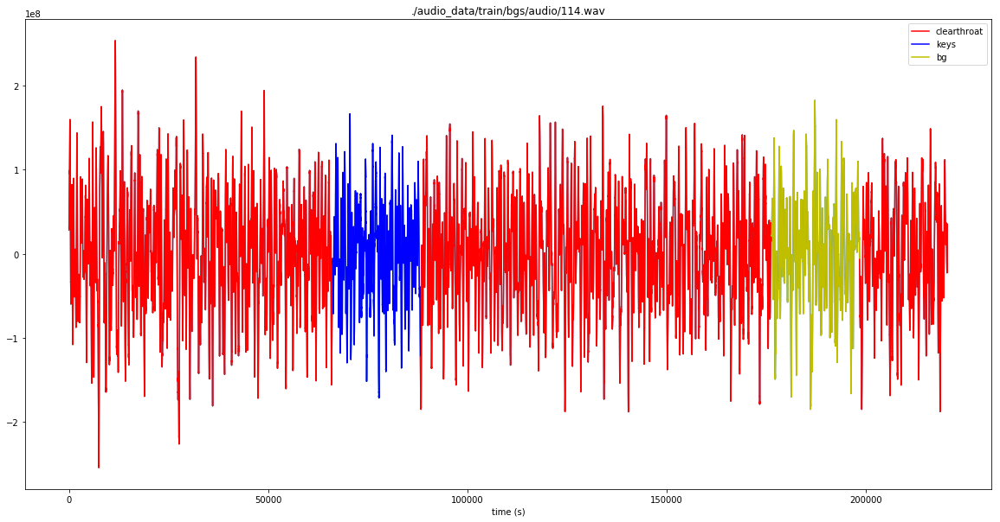

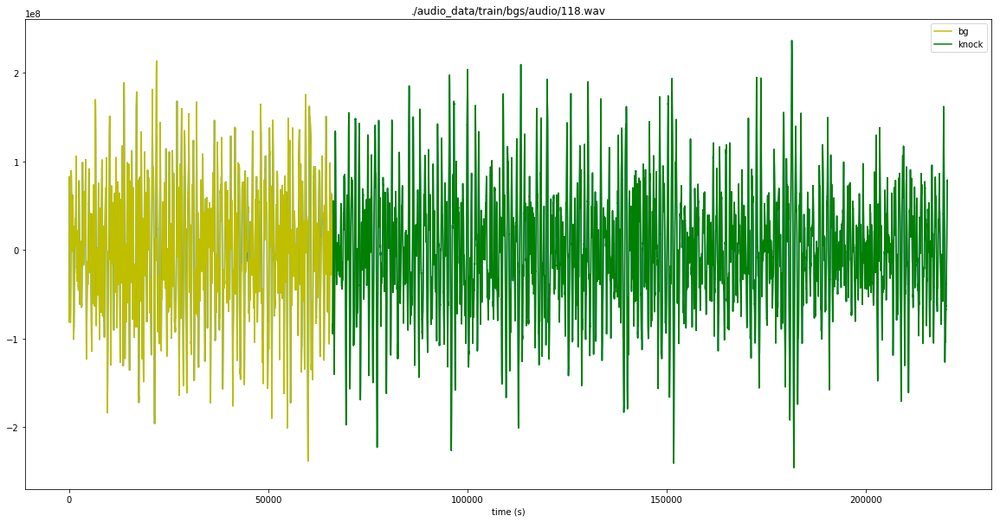

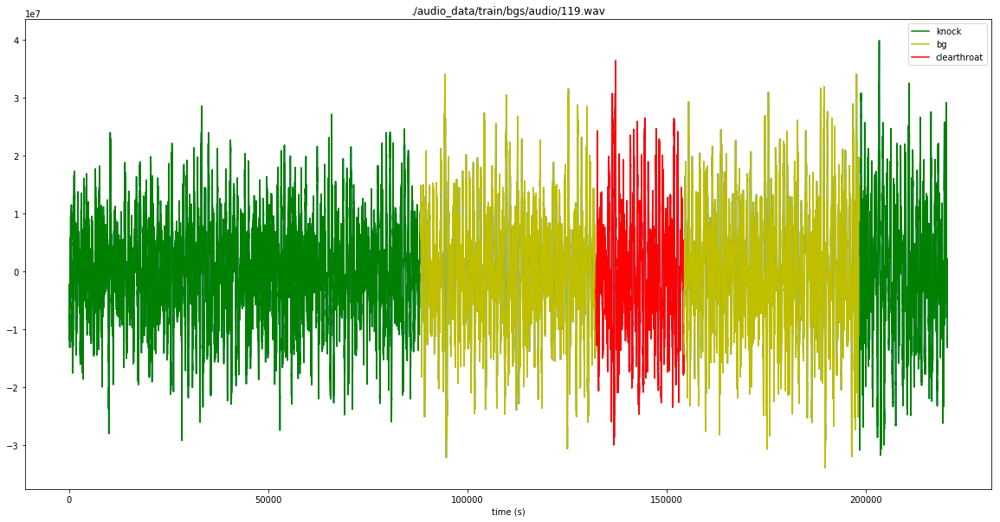

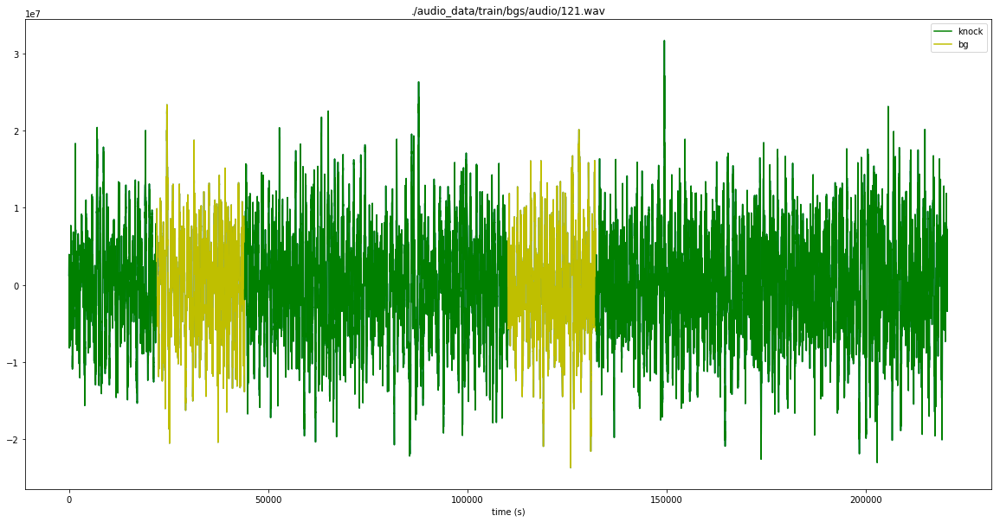

...

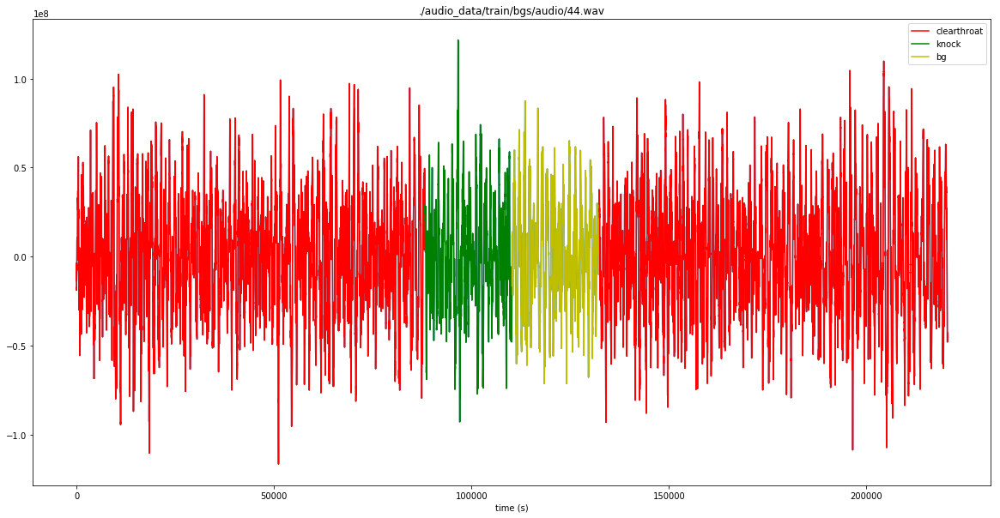

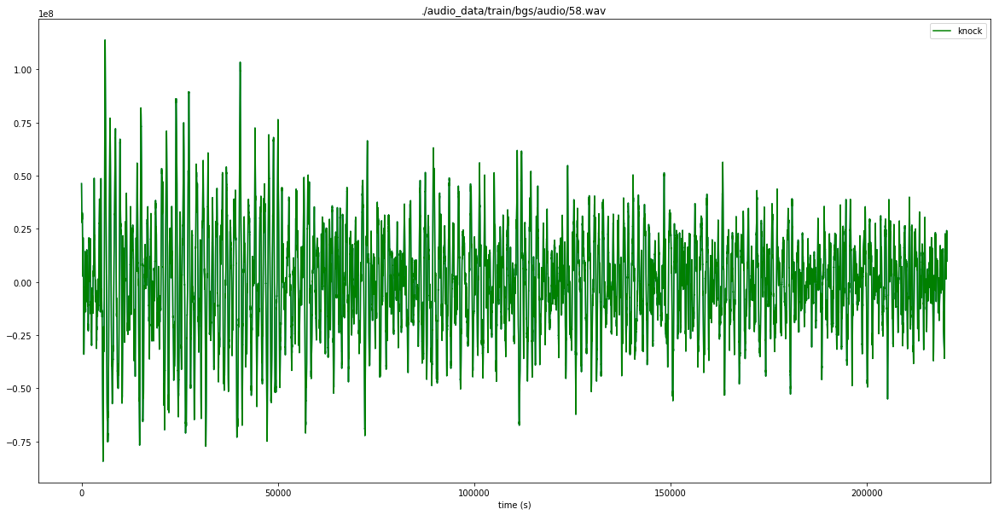

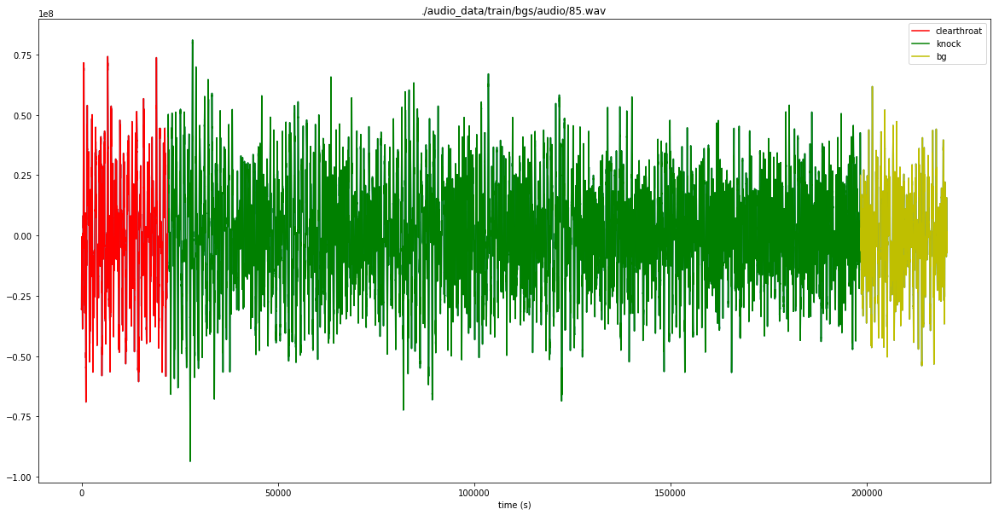

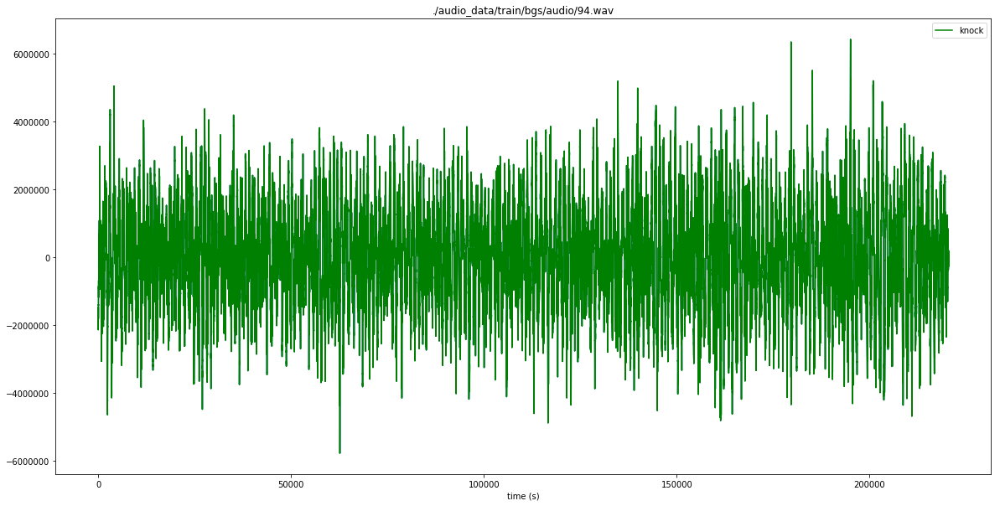

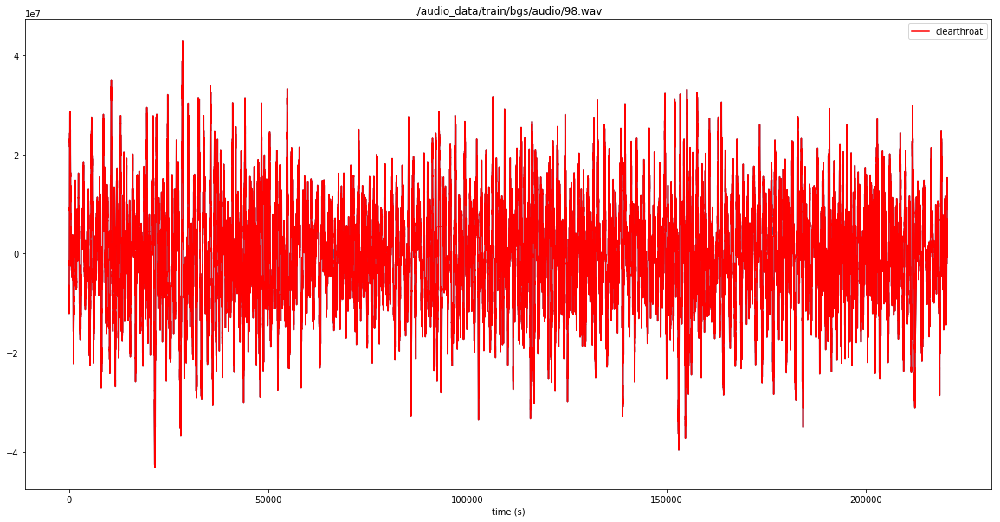

In [20]:
%%time
predict('./audio_data/train/bgs/audio/')

## Валидационная выборка

### Clearthroat

CPU times: user 288 ms, sys: 166 ms, total: 454 ms
Wall time: 461 ms


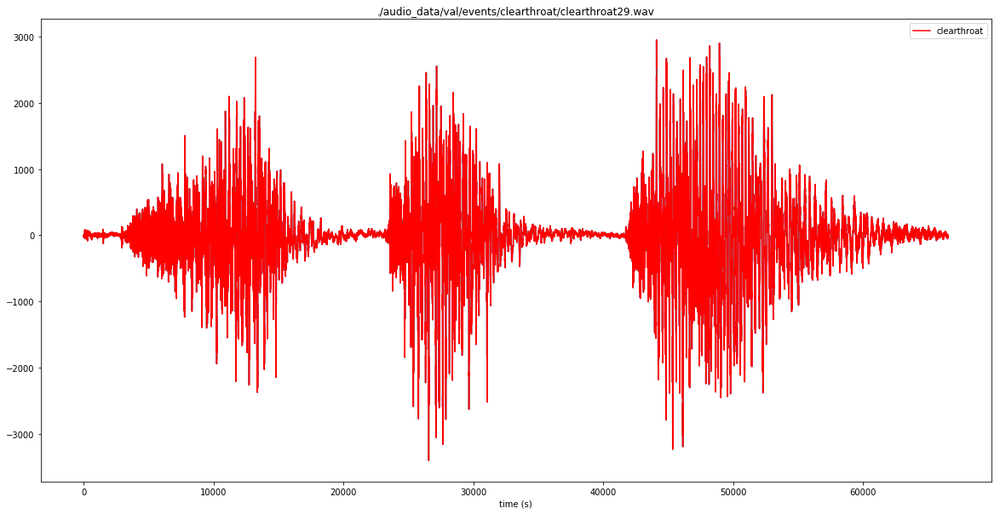

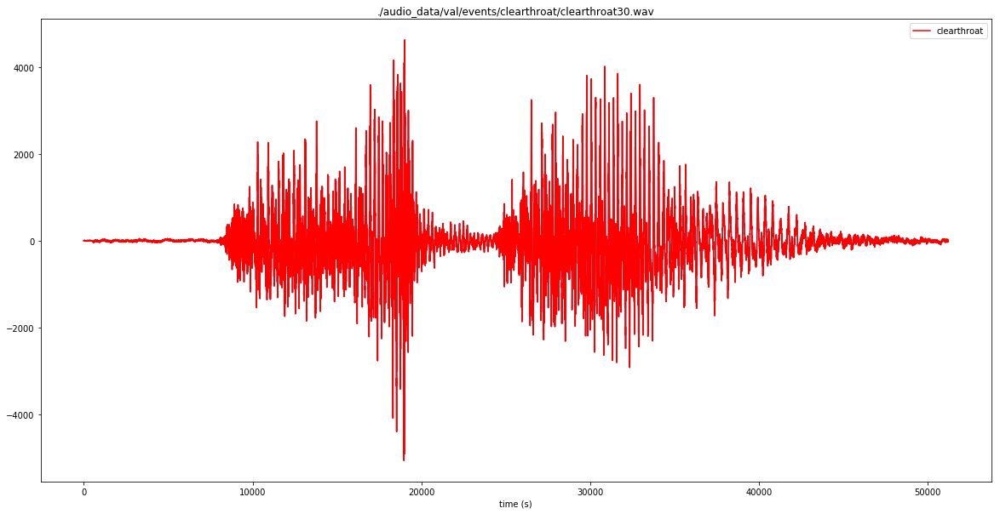

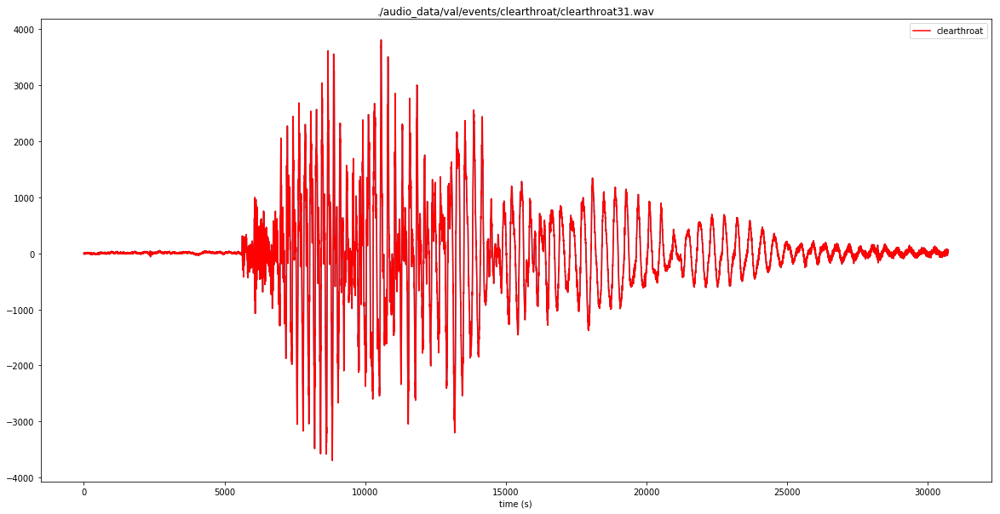

In [21]:
%%time
predict('./audio_data/val/events/clearthroat/')

### Keys

CPU times: user 267 ms, sys: 137 ms, total: 404 ms
Wall time: 413 ms


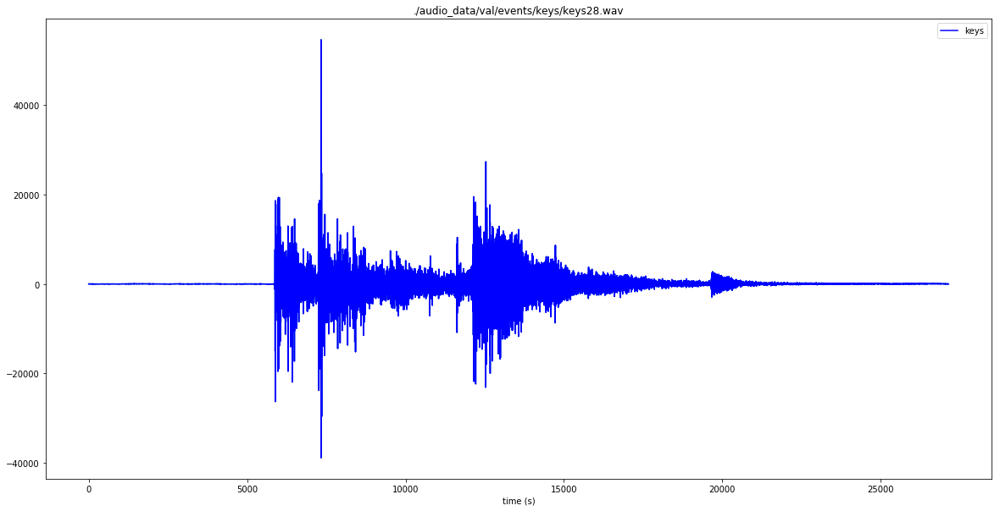

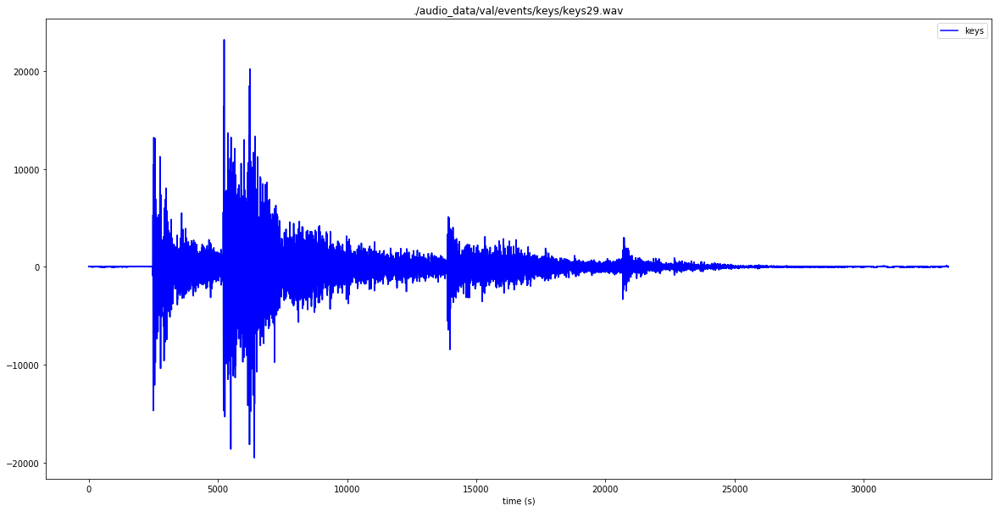

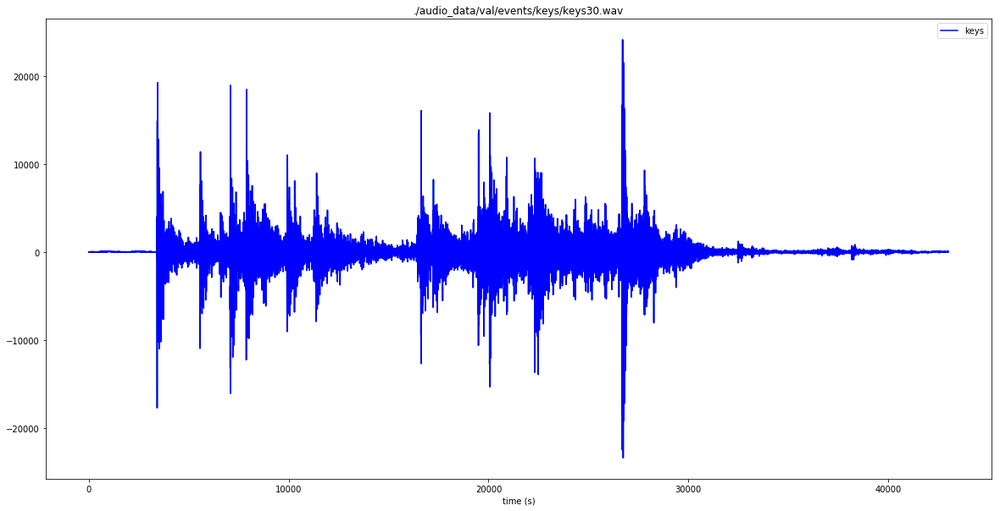

In [22]:
%%time
predict('./audio_data/val/events/keys/')

### Knock

CPU times: user 75.4 ms, sys: 9.4 ms, total: 84.8 ms
Wall time: 86.9 ms


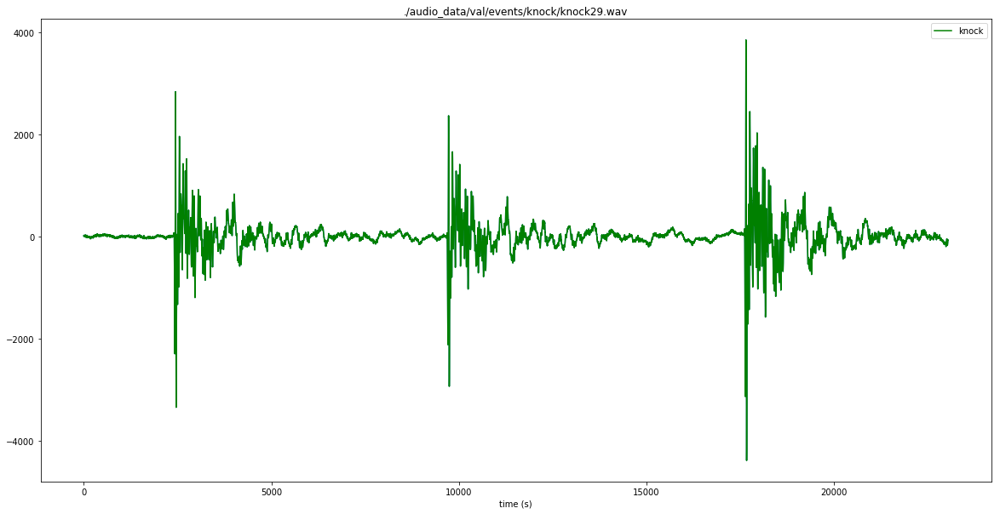

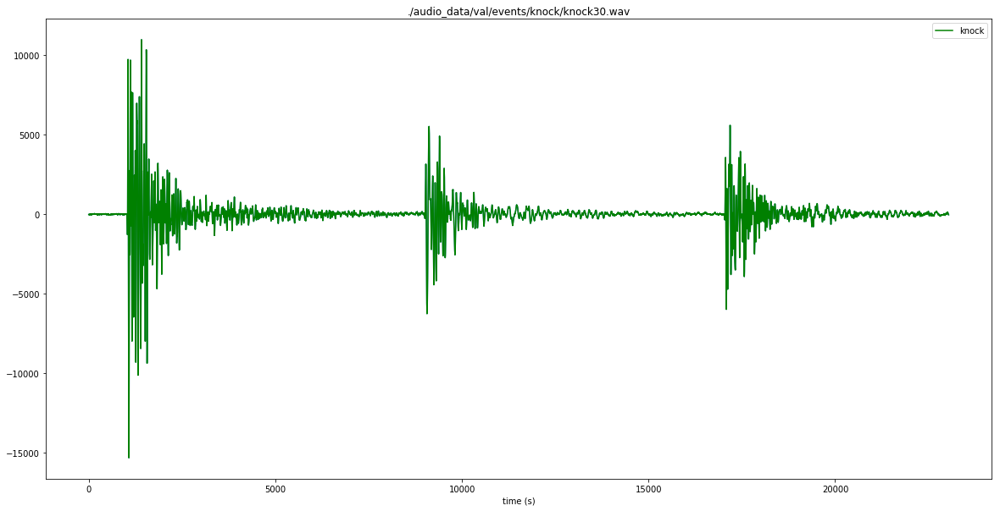

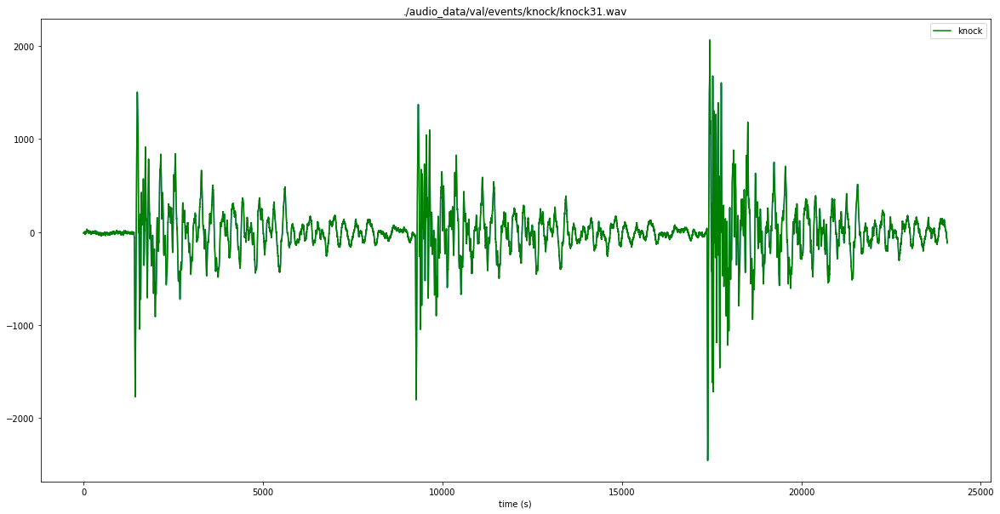

In [23]:
%%time
predict('./audio_data/val/events/knock/')

### Background

CPU times: user 402 ms, sys: 323 ms, total: 725 ms
Wall time: 727 ms


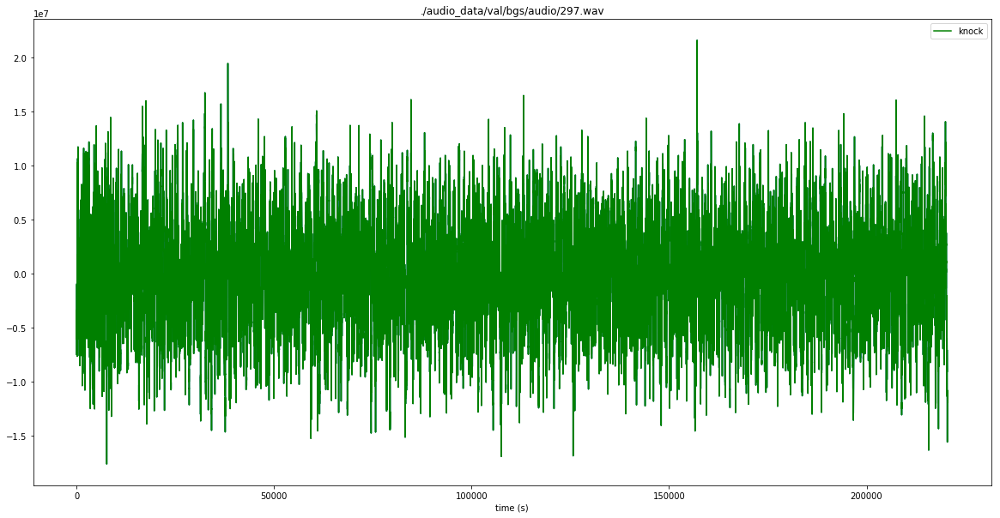

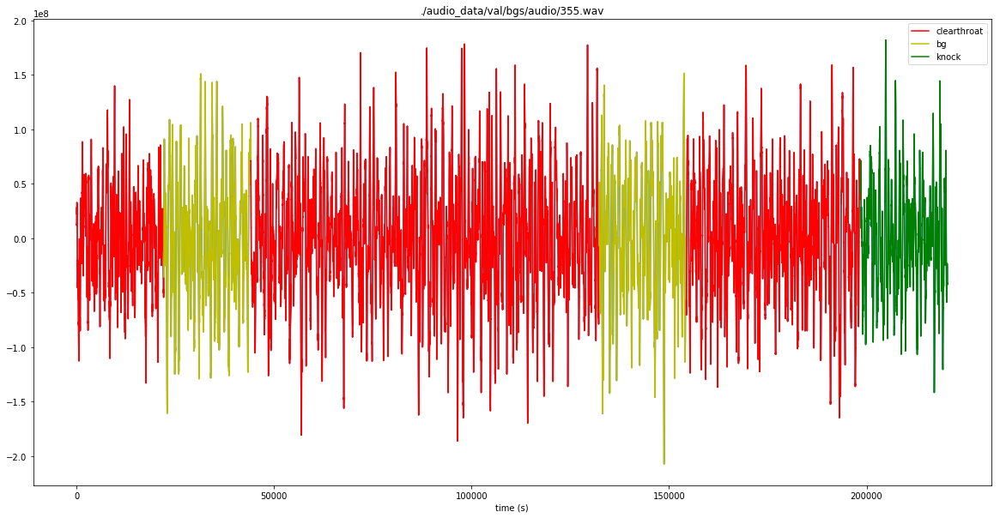

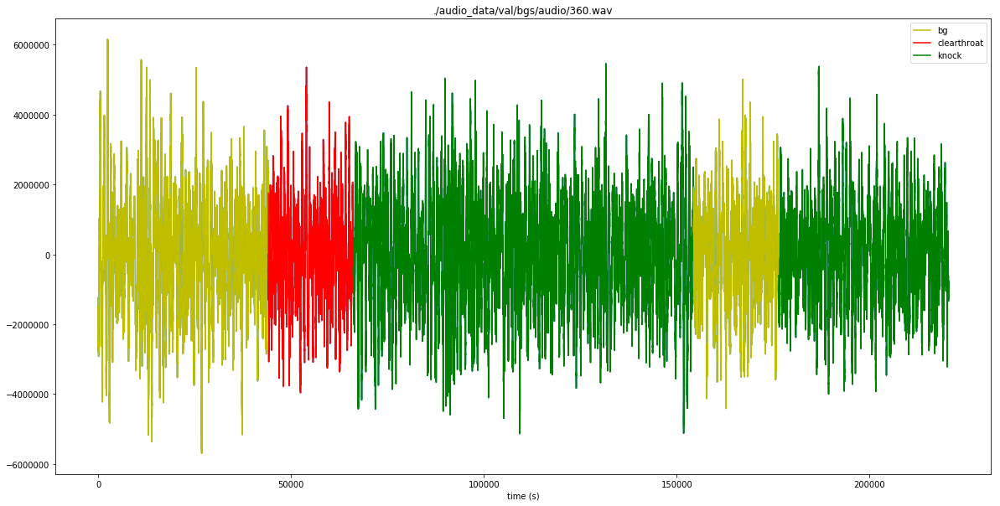

In [24]:
%%time
predict('./audio_data/val/bgs/audio/')

## Тестовая выборка

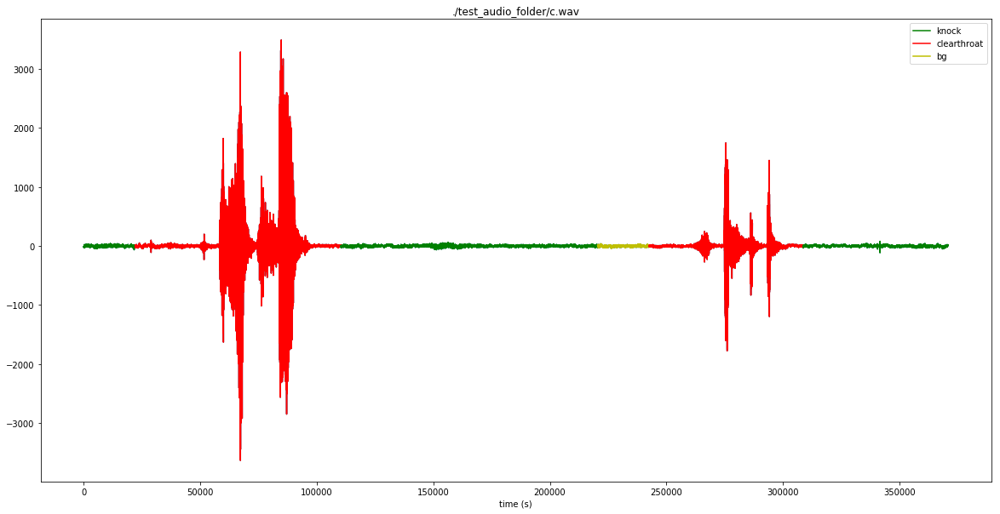

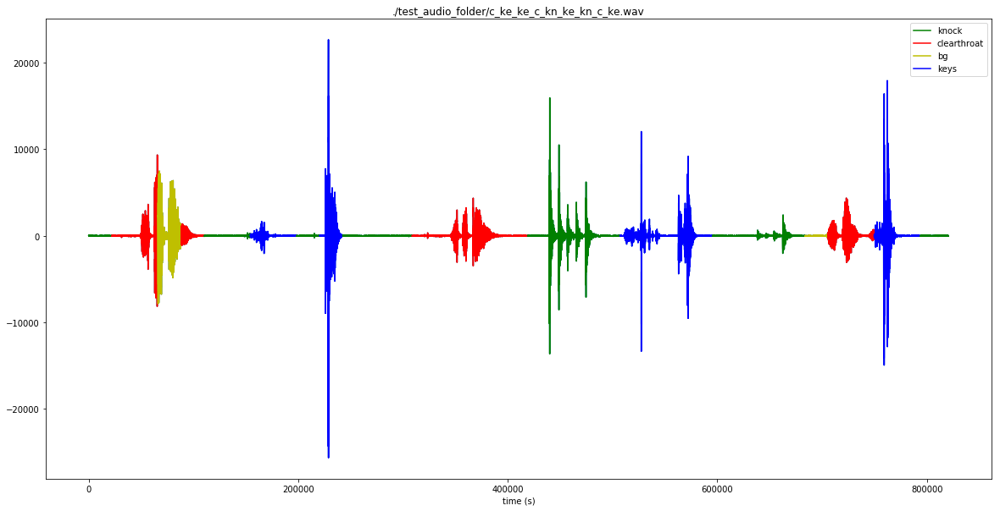

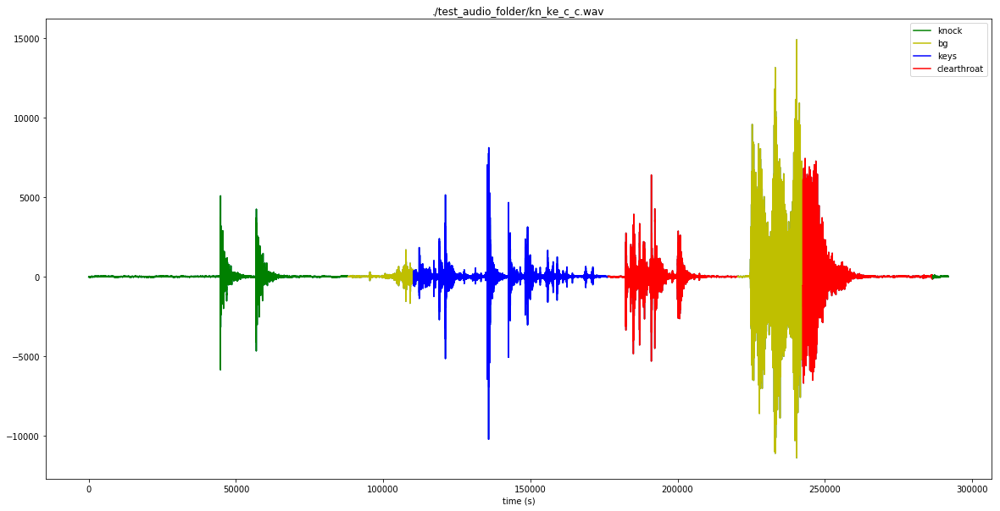

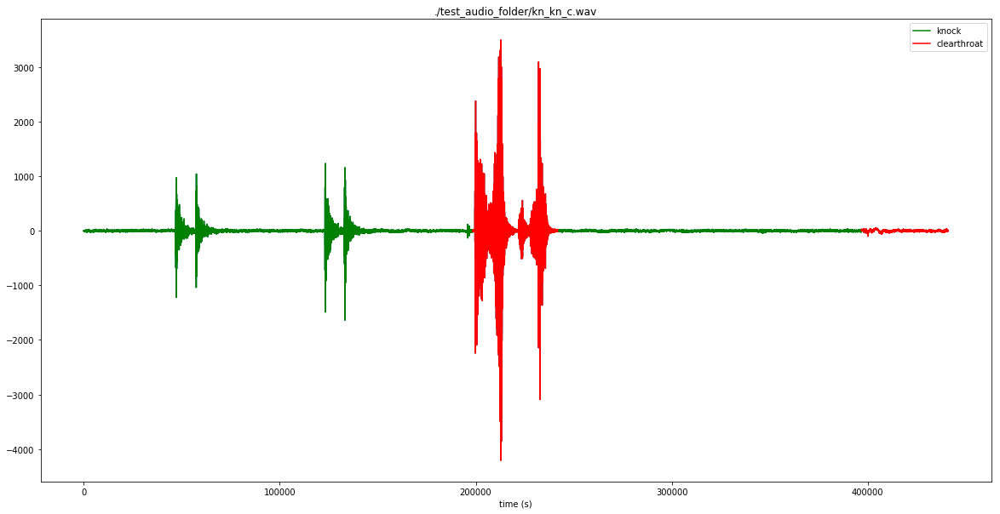

In [25]:
predict('./test_audio_folder/')